# **Telecom Churn**

The data is sourced from Kaggle comprising of The Orange Telecom groups datalog of it's clients

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
df = pd.read_csv('/content/churn-bigml-80.csv')

In [ ]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [ ]:
df.isna().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [ ]:
from scipy import stats
from sklearn.preprocessing import LabelEncoder

In [ ]:
label_encoder = LabelEncoder()
df['International plan'] = label_encoder.fit_transform(df['International plan'])
df['Voice mail plan'] = label_encoder.fit_transform(df['Voice mail plan'])

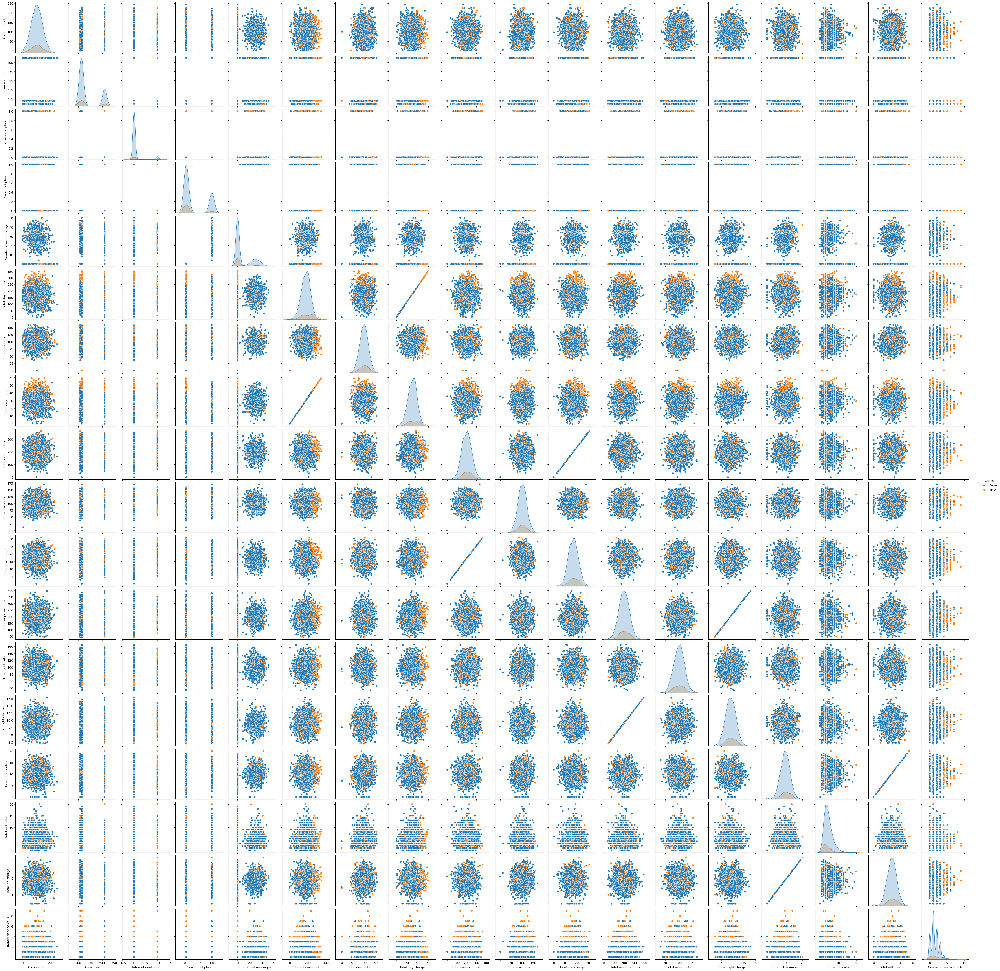

In [ ]:
sns.pairplot(df, hue='Churn')
plt.show()

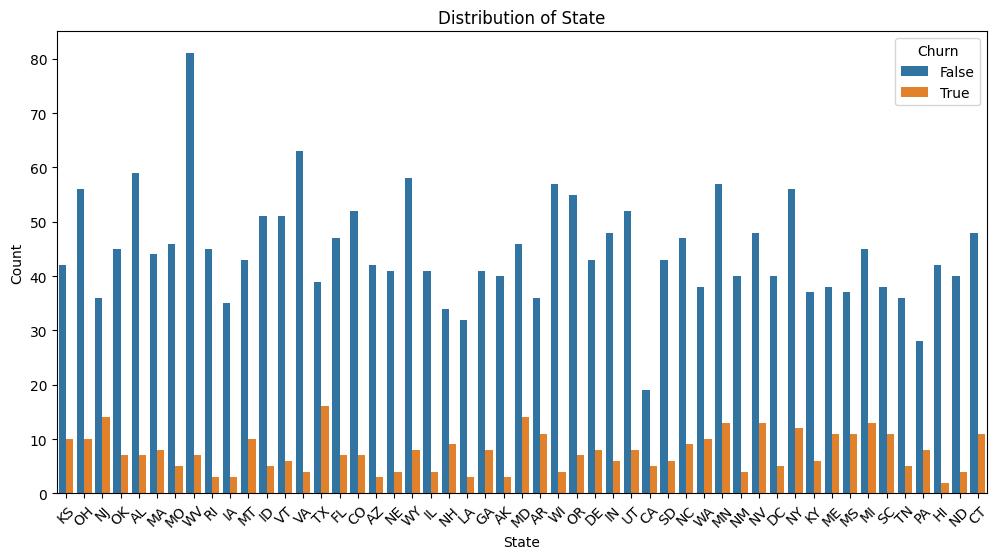

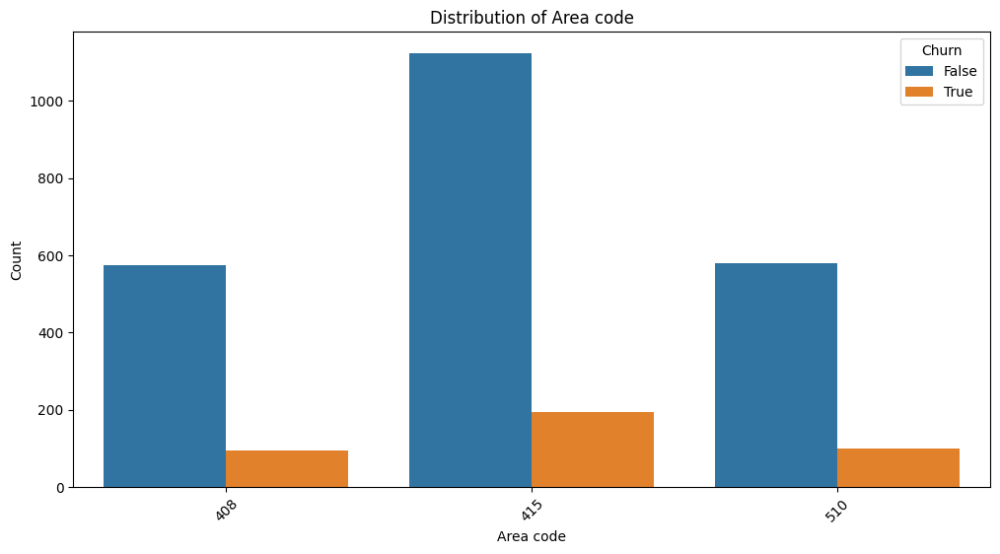

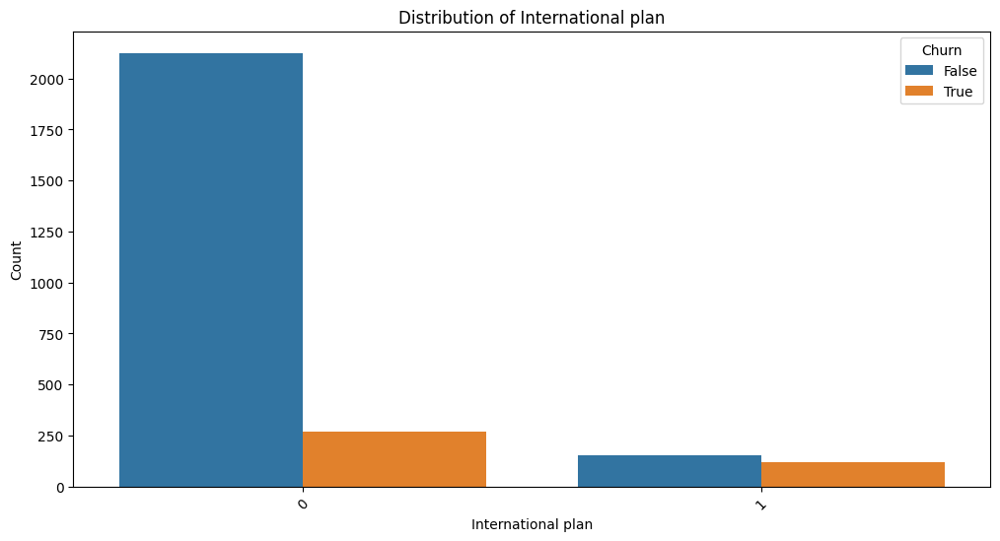

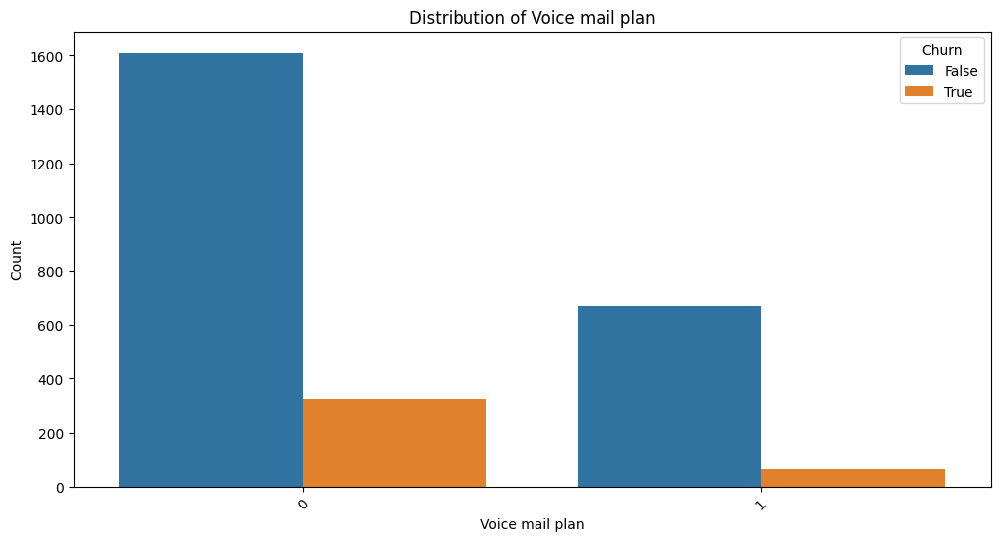

In [ ]:
categorical_features = ['State', 'Area code', 'International plan', 'Voice mail plan']

for feature in categorical_features:
    plt.figure(figsize=(12, 6))
    sns.countplot(x=feature, data=df, hue='Churn')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

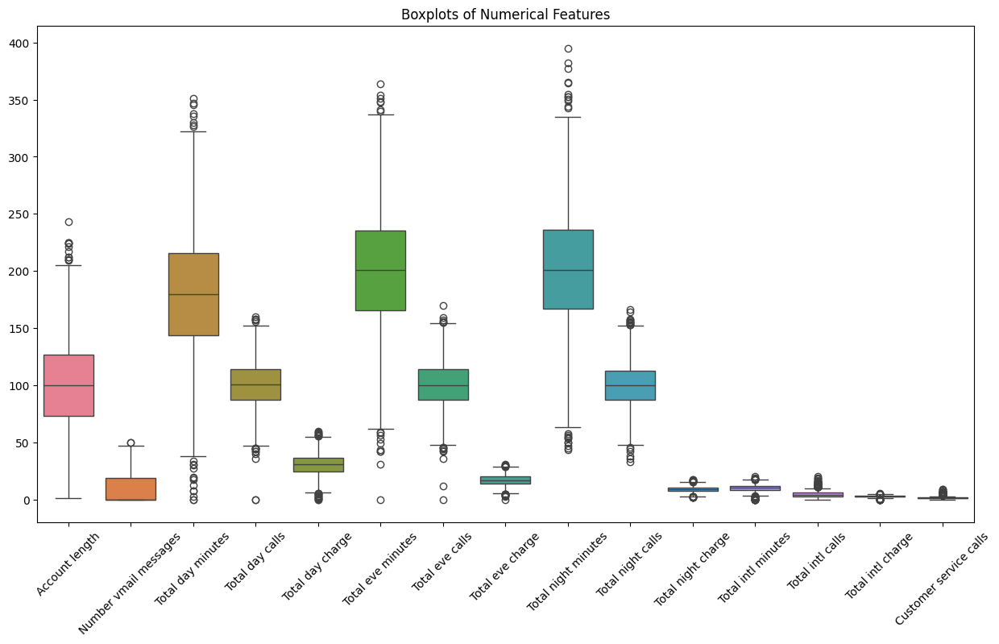

In [ ]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=df.drop(['State', 'Area code', 'International plan', 'Voice mail plan', 'Churn'], axis=1))
plt.title('Boxplots of Numerical Features')
plt.xticks(rotation=45)
plt.show()

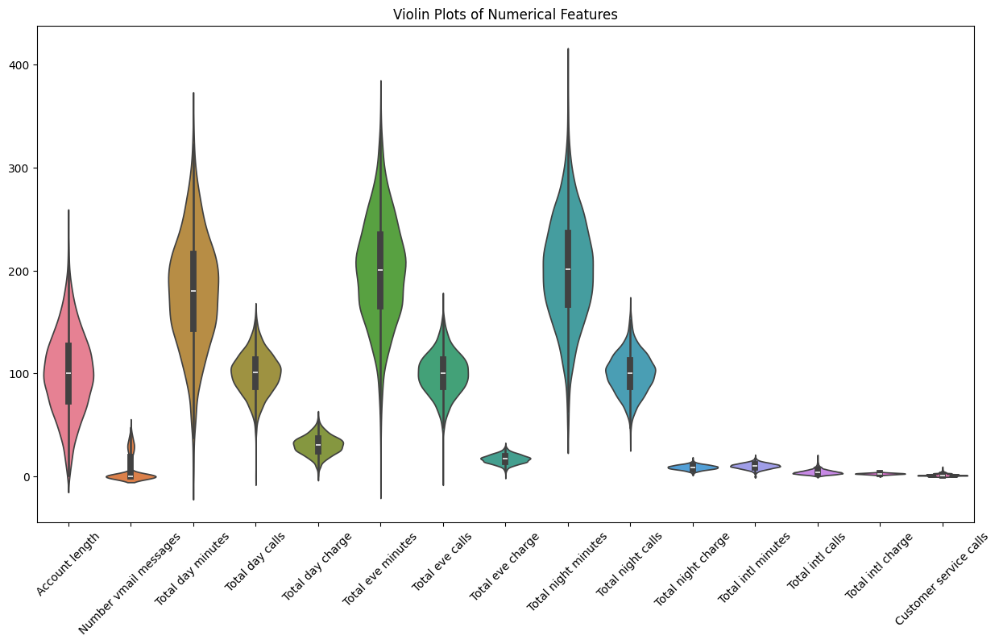

In [ ]:
plt.figure(figsize=(15, 8))
sns.violinplot(data=df.drop(['State', 'Area code', 'International plan', 'Voice mail plan', 'Churn'], axis=1))
plt.title('Violin Plots of Numerical Features')
plt.xticks(rotation=45)
plt.show()

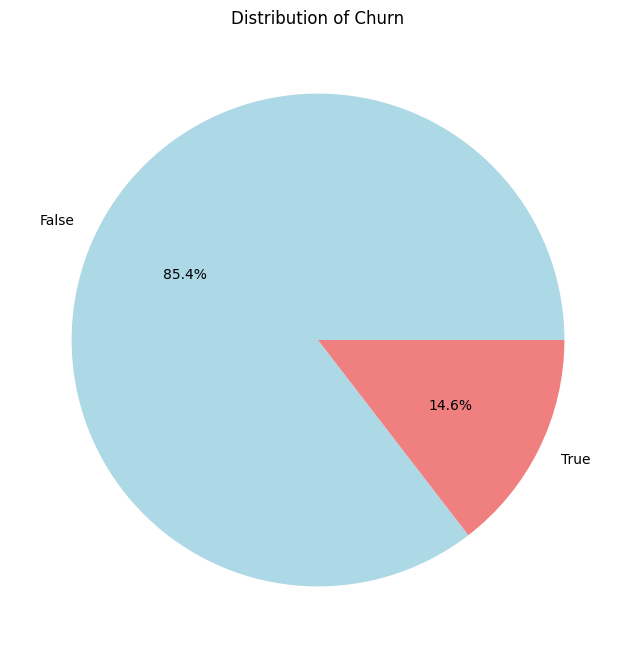

In [ ]:
plt.figure(figsize=(8, 8))
df['Churn'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
plt.title('Distribution of Churn')
plt.ylabel('')
plt.show()

For Balancing the Dataset

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Assuming X and y are your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Train a classifier on the balanced data
clf = LogisticRegression()
clf.fit(X_train_resampled, y_train_resampled)

# Evaluate the classifier on the test data
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))


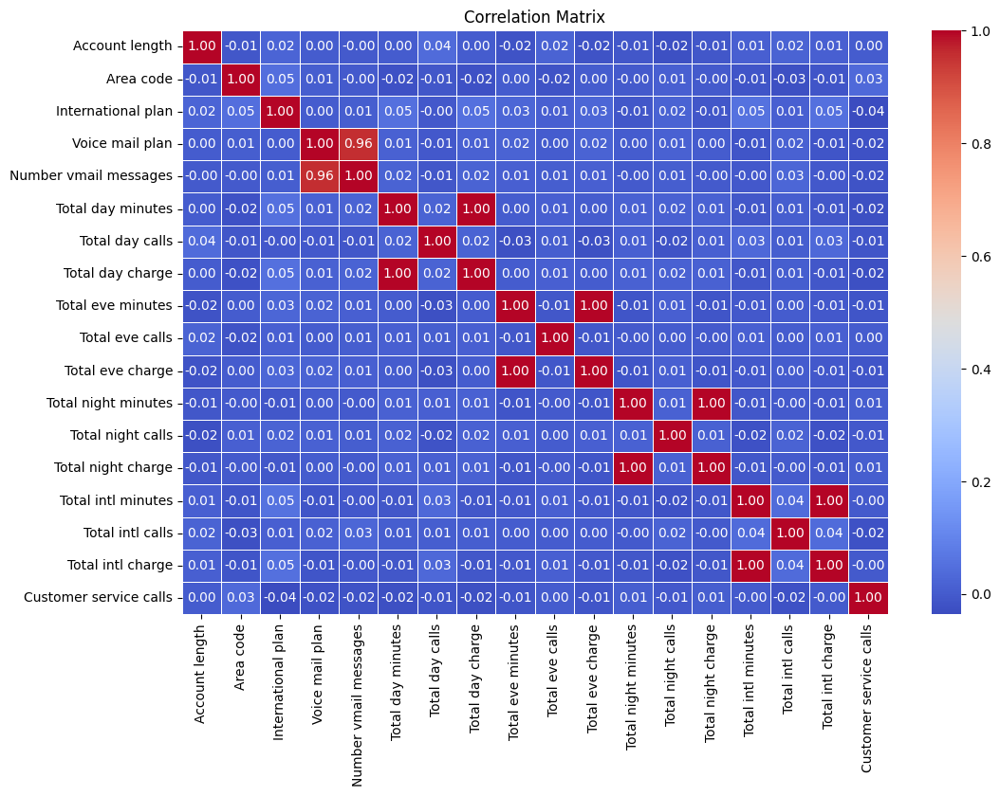

In [ ]:
numeric_df = df.select_dtypes(include='number')
correlation_matrix = numeric_df.corr()


plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [ ]:
df['State'] = label_encoder.fit_transform(df['State'])
df['Churn'] = label_encoder.fit_transform(df['Churn'])

In [ ]:
X = df.drop(columns=['Voice mail plan', 'Number vmail messages', 'Total day minutes',
                     'Total day charge', 'Total eve minutes', 'Total night minutes', 'Churn'])
y = df['Churn']

In [ ]:
X.head()

,State,Account length,Area code,International plan,Total day calls,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,16,128,415,0,110,99,16.78,91,11.01,10.0,3,2.70,1
1,35,107,415,0,123,103,16.62,103,11.45,13.7,3,3.70,1
2,31,137,415,0,114,110,10.30,104,7.32,12.2,5,3.29,0
3,35,84,408,1,71,88,5.26,89,8.86,6.6,7,1.78,2
4,36,75,415,1,113,122,12.61,121,8.41,10.1,3,2.73,3


In [ ]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# **Logistic Regression**

Used for Binary Classification

uses sigmoid function

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 534 entries, 2087 to 1992
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   534 non-null    int64  
 1   Account length          534 non-null    int64  
 2   Area code               534 non-null    int64  
 3   International plan      534 non-null    int64  
 4   Total day calls         534 non-null    int64  
 5   Total eve calls         534 non-null    int64  
 6   Total eve charge        534 non-null    float64
 7   Total night calls       534 non-null    int64  
 8   Total night charge      534 non-null    float64
 9   Total intl minutes      534 non-null    float64
 10  Total intl calls        534 non-null    int64  
 11  Total intl charge       534 non-null    float64
 12  Customer service calls  534 non-null    int64  
dtypes: float64(4), int64(9)
memory usage: 58.4 KB


In [ ]:
lr = LogisticRegression()

In [ ]:
lr.fit(X_train_scaled, y_train)

LogisticRegression()

In [ ]:
y_pred = lr.predict(X_test_scaled)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, f1_score, confusion_matrix

In [ ]:
lr_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", lr_accuracy)

Accuracy: 0.8445692883895131


In [ ]:
lr_f1 = f1_score(y_test, y_pred)
print("F1 Score:", lr_f1)

F1 Score: 0.1782178217821782


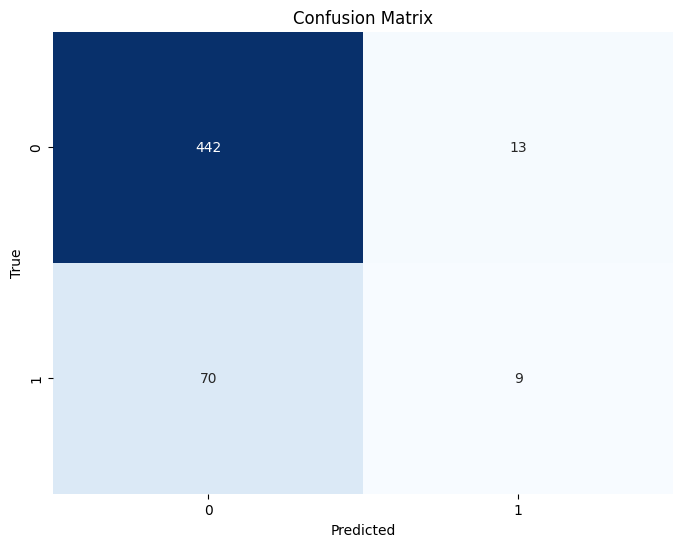

In [ ]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **SVM**
Scaler Vector Machine

In [ ]:
from sklearn.model_selection import  GridSearchCV
from sklearn.svm import SVC

In [ ]:
X = df.drop(columns=["Churn"])
y = df["Churn"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 534 entries, 2087 to 1992
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   534 non-null    int64  
 1   Account length          534 non-null    int64  
 2   Area code               534 non-null    int64  
 3   International plan      534 non-null    int64  
 4   Voice mail plan         534 non-null    int64  
 5   Number vmail messages   534 non-null    int64  
 6   Total day minutes       534 non-null    float64
 7   Total day calls         534 non-null    int64  
 8   Total day charge        534 non-null    float64
 9   Total eve minutes       534 non-null    float64
 10  Total eve calls         534 non-null    int64  
 11  Total eve charge        534 non-null    float64
 12  Total night minutes     534 non-null    float64
 13  Total night calls       534 non-null    int64  
 14  Total night charge      534 non-null    flo

In [ ]:
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}


In [ ]:
grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='f1')
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='f1')

In [ ]:
y_pred = grid_search.predict(X_test_scaled)

In [ ]:
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'C': 10, 'kernel': 'rbf'}


In [ ]:
svm_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", svm_accuracy)

Accuracy: 0.9119850187265918


In [ ]:
svm_f1 = f1_score(y_test, y_pred)
print("F1 Score:", svm_f1)

F1 Score: 0.6666666666666667


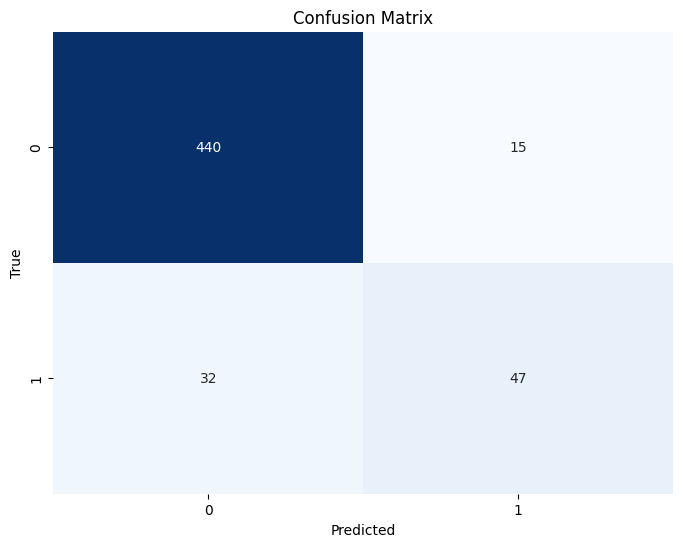

In [ ]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **Random Forest Classifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
X = df.drop(columns=["Churn"])
y = df["Churn"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 534 entries, 2087 to 1992
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   534 non-null    int64  
 1   Account length          534 non-null    int64  
 2   Area code               534 non-null    int64  
 3   International plan      534 non-null    int64  
 4   Voice mail plan         534 non-null    int64  
 5   Number vmail messages   534 non-null    int64  
 6   Total day minutes       534 non-null    float64
 7   Total day calls         534 non-null    int64  
 8   Total day charge        534 non-null    float64
 9   Total eve minutes       534 non-null    float64
 10  Total eve calls         534 non-null    int64  
 11  Total eve charge        534 non-null    float64
 12  Total night minutes     534 non-null    float64
 13  Total night calls       534 non-null    int64  
 14  Total night charge      534 non-null    flo

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred_rf = rf_model.predict(X_test)

In [ ]:
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Random Forest Accuracy:", accuracy_rf)

Random Forest Accuracy: 0.951310861423221


In [ ]:
f1_rf = f1_score(y_test, y_pred_rf)
print("Random Forest F1 Score:", f1_rf)

Random Forest F1 Score: 0.8030303030303031


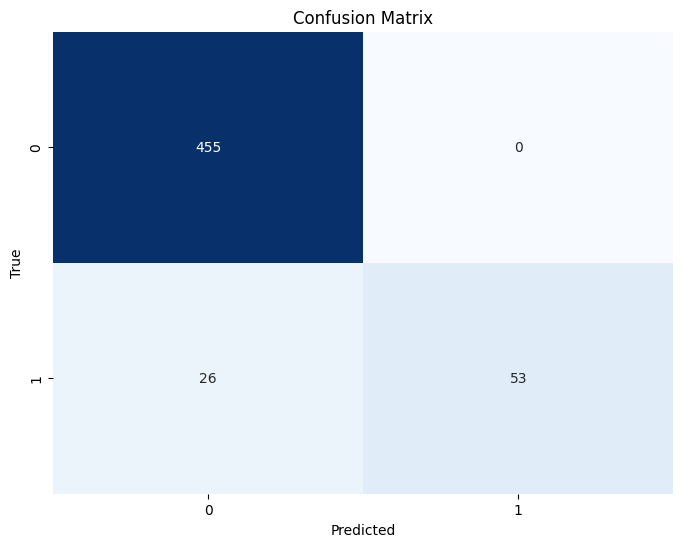

In [ ]:
cm = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **XGBoost**

In [ ]:
import xgboost as xgb

In [ ]:
xgb_model = xgb.XGBClassifier(learning_rate=0.1, n_estimators=100, max_depth=3)  # Adjust parameters as needed
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
y_pred_xgb = xgb_model.predict(X_test)

In [ ]:
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Accuracy:", accuracy_xgb)


XGBoost Accuracy: 0.9438202247191011


In [ ]:
f1_xgb = f1_score(y_test, y_pred_xgb)
print("XGBoost F1 Score:", f1_xgb)

XGBoost F1 Score: 0.7794117647058824


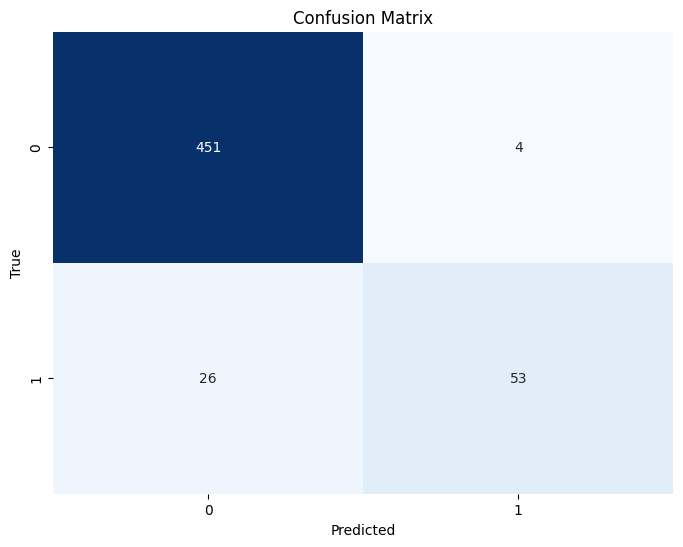

In [ ]:
cm = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

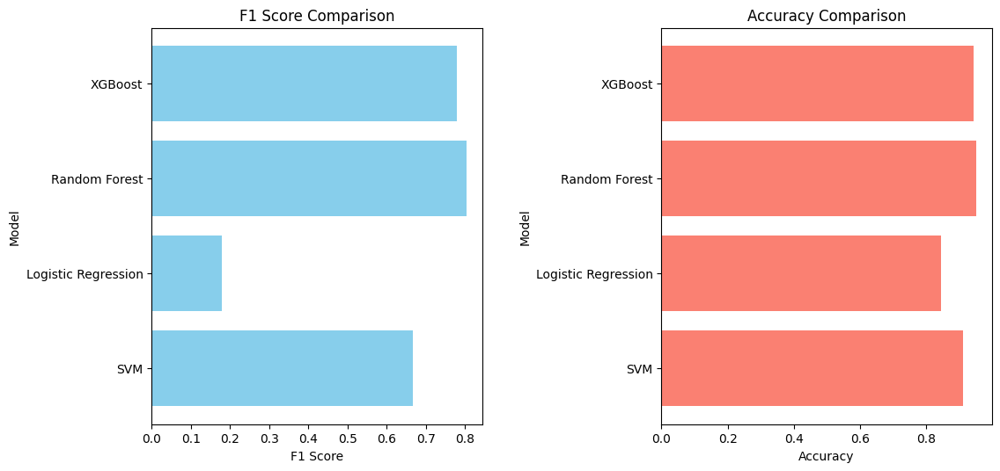

In [ ]:
import matplotlib.pyplot as plt

# Evaluation Metrics
models = ['SVM', 'Logistic Regression', 'Random Forest', 'XGBoost']
f1_scores = [svm_f1, lr_f1, f1_rf, f1_xgb]
accuracies = [svm_accuracy, lr_accuracy, accuracy_rf, accuracy_xgb]

# Plotting
plt.figure(figsize=(12, 6))

# F1 Scores
plt.subplot(1, 2, 1)
plt.barh(models, f1_scores, color='skyblue')
plt.title('F1 Score Comparison')
plt.xlabel('F1 Score')
plt.ylabel('Model')

# Accuracies
plt.subplot(1, 2, 2)
plt.barh(models, accuracies, color='salmon')
plt.title('Accuracy Comparison')
plt.xlabel('Accuracy')
plt.ylabel('Model')

plt.tight_layout(pad=3)
plt.show()


Saving the pickel file of the trained model

In [ ]:
import pickle
from google.colab import files

In [ ]:
with open('model_rf.pkl', 'wb') as f:
    pickle.dump(rf_model, f)

In [ ]:
files.download('model_rf.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>